In [1]:
########################################################################### START ###########################################################################
# Access to Drive
# Modules
# Data import
# DataFrames

## Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import EfficientNetB3

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')
import leukopy_lib as leuko
from importlib import reload

reload(leuko)

## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mounted at /content/drive
Fri Oct  1 08:26:55 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    33W / 250W |    345MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

In [ ]:
########################################################################### DATAFRAME

## Need to copy all the files on the local computer
!cp -r "/content/drive/MyDrive/Leukopy/data/main_dataset.zip" .
!unzip main_dataset.zip

## Create the original dataframes 
path = Path('/content/main_dataset/')

df_train = leuko.generate_images_df(path/'training_set')
df_test = leuko.generate_images_df(path/'testing_set')
df_valid = leuko.generate_images_df(path/'validation_set')

In [3]:
def choose_classes(df_train, df_test, df_valid, n_classes = 12):

  # Option à 11 classes, sans les BL
  if n_classes == 11:
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

  # Option à 8 classes (IG, SNE), sans les BL :
  if n_classes == 8:
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

    df_train["label"] = df_train["label_2"]
    df_test["label"] = df_test["label_2"]
    df_valid["label"] = df_valid["label_2"]

  # Option à 9 classes (IG, SNE, BL)
  if n_classes == 9:
    df_train["label"] = df_train["label_2"]
    df_test["label"] = df_test["label_2"]
    df_valid["label"] = df_valid["label_2"]

  return n_classes, df_train, df_test, df_valid

n_classes, df_train, df_test, df_valid = choose_classes(df_train, df_test, df_valid, n_classes = 11)

In [4]:
df_train["label"].value_counts()

EO     2352
PLT    1743
SNE    1263
BNE    1212
ERB    1162
MO     1068
LY      946
BA      903
MY      833
MMY     734
PMY     461
Name: label, dtype: int64

In [5]:
########################################################################### Génération d'images ###########################################################################

batch_size = 32
img_height  = 300
img_width = 300

# EfficientNet normalizes the pictures. Data augmentation : rotation, zoom, brightness => only on training set
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Resize pictures, batchs from dataframe
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size,
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [6]:
import matplotlib.cm as cm
def get_img_array(img_path, size):
  # size = (img_height, img_width)

  img = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  array = tf.keras.preprocessing.image.img_to_array(img)
  array = np.expand_dims(array, axis = 0)
  return array

def make_heatmap(img_array, model, last_conv_layer, class_index):

  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  for i in range(last_conv_layer_output.shape[3]):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)
  return heatmap

def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Détecte la dernière couche de convolution (pas terrible : il faudrait sélectionner sur le type, pas sur le nom) :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break


  # Chargement + mise en forme de l'image :
  img_array = get_img_array(img_path, size = (img_height, img_width))

  # Choix de la classe à représenter :
  if class_index == None :
    # Désactiver Sotfmax sur la couche de sortie :
    model.layers[-1].activation = None
    # Prédiction + classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour comparaison avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap

  ## Traitement de la Heatmap
  # 1/ Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()
  # 2/ On passe dans ReLu, pour flinguer les valeurs négatives
  big_heatmap = np.maximum(0, big_heatmap)
  
  ## Superposition de l'image et de la Heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)

  # 3/ Jet colormap
  jet = cm.get_cmap("jet")

  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  # Réactive softmax si elle a été désactivée plus haut :
  if class_index == None :
    model.layers[-1].activation = 'softmax'

  return big_heatmap, superimposed_img

In [7]:
# Calcul des poids pour compenser le déséquilibre des classes

def compute_weights(method = 3):

  if method == 1:
    counter = Counter(training_set.classes)     
    class_weights = {class_id : float(max(counter.values()))/num_images for class_id, num_images in counter.items()} 
    return class_weights

  if method == 2:
    class_weights = compute_class_weight(class_weight = 'balanced',
                                         classes = np.unique(training_set.classes),
                                         y = training_set.classes)
    class_weights = dict(enumerate(class_weights))
    return class_weights

  counter = Counter(training_set.classes)                          
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()} 
  return class_weights

In [ ]:
########################################################################### MODEL - FUNC. ###########################################################################
# B3 + Dense(1280, Relu) + Dropout(0.2) + Dense(640, Relu) + Dropout(0.2) + Dense(n_classes, Softmax) 
# weights = 'ImageNet'
# include_top = False

# Model (Functional API) -- BatchNormalization layers in EfficientNet run in 'inference mode'
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB3(include_top = False,
                           weights = 'imagenet',
                           input_shape = (img_height,img_width,3),
                           input_tensor = inputs,
                           pooling = 'avg')
base_output = base_model.output      # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner
x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

# Freeze EfficientNet
base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
# Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 5, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 30
history = model.fit(x = training_set, 
                    epochs = epochs,
                    callbacks = callbacks_list, 
                    validation_data = validation_set, 
                    class_weight = class_weights)

Epoch 1/30
397/397 [==============================] - 297s 661ms/step - loss: 6.2341 - accuracy: 0.6107 - val_loss: 0.6430 - val_accuracy: 0.7705
Epoch 2/30
397/397 [==============================] - 258s 649ms/step - loss: 4.2811 - accuracy: 0.7328 - val_loss: 0.6042 - val_accuracy: 0.7827
Epoch 3/30
397/397 [==============================] - 257s 647ms/step - loss: 3.9275 - accuracy: 0.7581 - val_loss: 0.5668 - val_accuracy: 0.7913
Epoch 4/30
397/397 [==============================] - 260s 656ms/step - loss: 3.6755 - accuracy: 0.7790 - val_loss: 0.5406 - val_accuracy: 0.7798
Epoch 5/30
397/397 [==============================] - 258s 651ms/step - loss: 3.5046 - accuracy: 0.7819 - val_loss: 0.5054 - val_accuracy: 0.8098
Epoch 6/30
397/397 [==============================] - 258s 650ms/step - loss: 3.3310 - accuracy: 0.7955 - val_loss: 0.4936 - val_accuracy: 0.8127
Epoch 7/30
397/397 [==============================] - 257s 646ms/step - loss: 3.3960 - accuracy: 0.7959 - val_loss: 0.4824 -

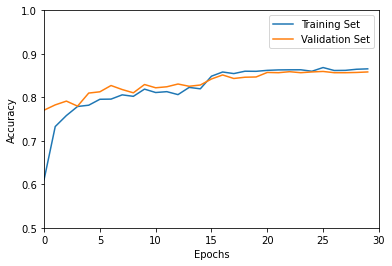

In [ ]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

plt.figure()
plt.plot(np.arange(epochs), training_accuracy, label = 'Training Set')
plt.plot(np.arange(epochs), validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,epochs])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
## Évaluation sur les données de test :
model.evaluate(testing_set)

80/80 [==============================] - 11s 140ms/step - loss: 0.3763 - accuracy: 0.8522


[0.3762756586074829, 0.8522012829780579]

In [ ]:
## Sauvegarde :
model.save("/content/drive/MyDrive/Leukopy/EfficientNet_B3_TL_11/model_fullsave")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EfficientNet_B3_TL_11/model_fullsave/assets


In [ ]:
########################################################################### ANALYSE - MODEL - FUNC. #########################################

In [39]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/EfficientNet_B3_TL_11/model_fullsave")
model.evaluate(testing_set)

80/80 [==============================] - 13s 134ms/step - loss: 0.3763 - accuracy: 0.8522


[0.3762757182121277, 0.8522012829780579]

In [14]:
len(model.layers)

390

In [15]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 300, 300, 3) 0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 300, 300, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
normalization_2 (Normalization) (None, 300, 300, 3)  7           rescaling_2[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 301, 301, 3)  0           normalization_2[0][0]            
____________________________________________________________________________________________

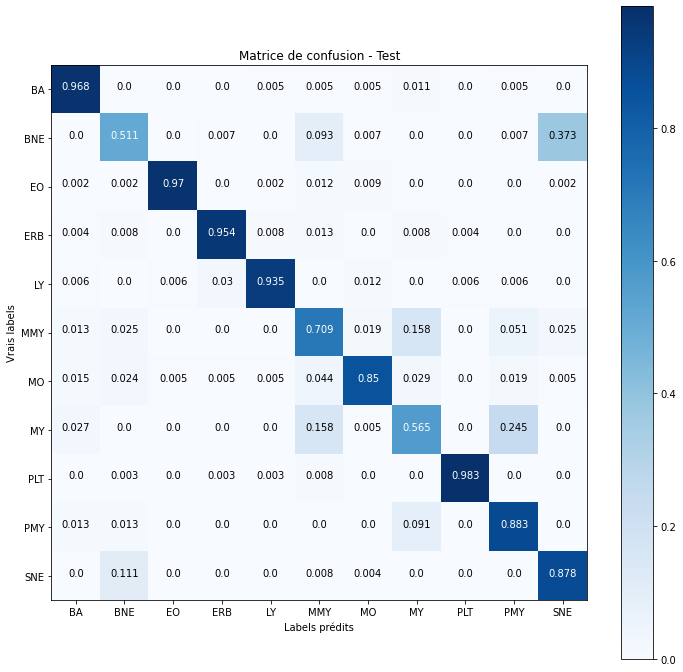

Classification Report - Test


,precision,recall,f1-score,support
BA,0.928934,0.968254,0.948187,189
BNE,0.761111,0.511194,0.611607,268
EO,0.995249,0.969907,0.982415,432
ERB,0.961702,0.953586,0.957627,237
LY,0.96319,0.934524,0.94864,168
MMY,0.592593,0.708861,0.645533,158
MO,0.925926,0.849515,0.886076,206
MY,0.712329,0.565217,0.630303,184
PLT,0.994429,0.983471,0.98892,363
PMY,0.527132,0.883117,0.660194,77


In [40]:
### 1 -- Rapport de classification :
def print_classification_report(testing_set, labels, title):

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report - "+title)
  return y_pred, display(df_report), 


## Bilan sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [41]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

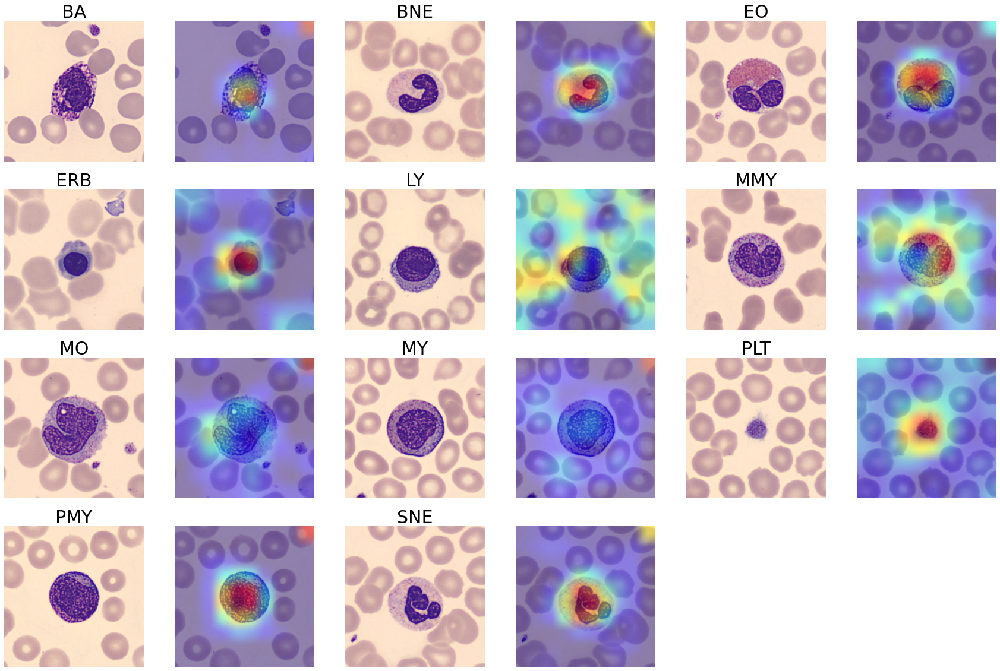

In [42]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EfficientNet_B3_TL_11/B3_gradcam_TL")

In [44]:
df_ERB = df_true[df_true["real"] == 3]

,real,pred,img_path
15,3,3,/content/main_dataset/testing_set/ERB_293204.jpg
17,3,3,/content/main_dataset/testing_set/ERB_444576.jpg
38,3,3,/content/main_dataset/testing_set/ERB_702211.jpg
39,3,3,/content/main_dataset/testing_set/ERB_915993.jpg
44,3,3,/content/main_dataset/testing_set/ERB_820036.jpg


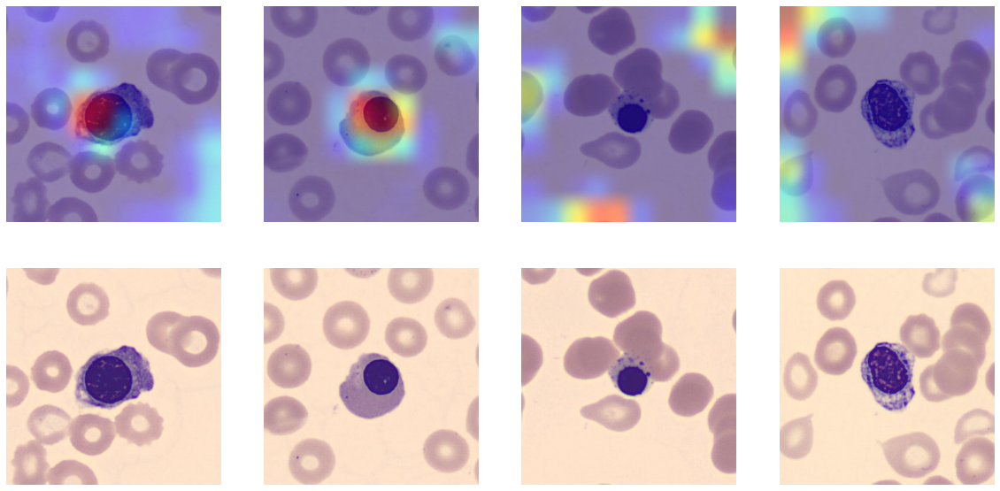

In [49]:
## Cas des ERB : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_ERB = df_true[df_true["real"] == 3]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_ERB.index)
  img_path = df_ERB.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

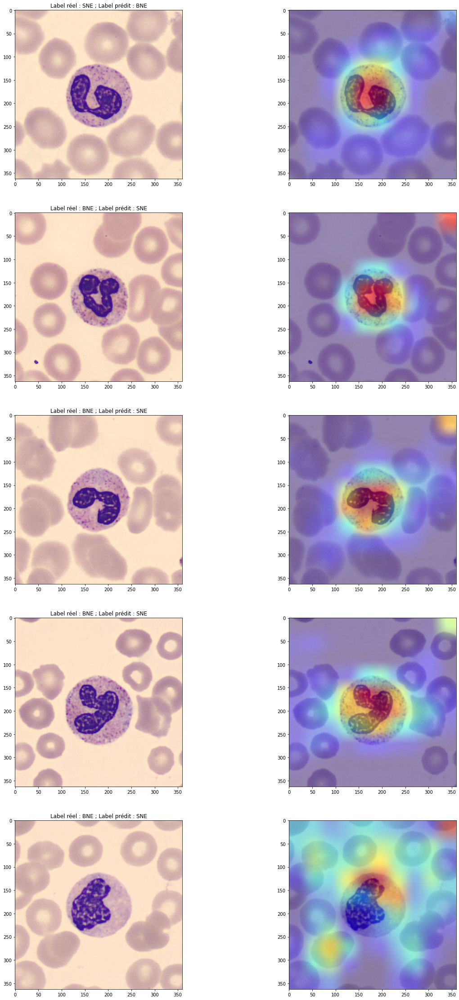

In [19]:
### 4 -- Exemples d'images mal classées :
# Exemple : Confusion BNE/SNE : labels 1 et 10

conf_bne_sne = df_false[((df_false["real"] == 1) & (df_false["pred"] == 10)) | ((df_false["real"] == 10) & (df_false["pred"] == 1))]

i = 0

fig = plt.figure(figsize = (20,40))

for id in np.random.choice(conf_bne_sne.index, size = 5, replace = False):
  img_path = conf_bne_sne.loc[id,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)
 
  fig.add_subplot(5,2,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title("Label réel : %s ; Label prédit : %s"%(list(label_map.keys())[conf_bne_sne.loc[id,"real"]],
                                                   list(label_map.keys())[conf_bne_sne.loc[id,"pred"]]))
  
  fig.add_subplot(5,2,i+2)
  plt.imshow(superimposed_img)
  i = i + 2

In [ ]:
conf_bne_sne.head()

,real,pred,img_path
2,1,10,/content/main_dataset/testing_set/BNE_423757.jpg
3,10,1,/content/main_dataset/testing_set/SNE_198347.jpg
7,1,10,/content/main_dataset/testing_set/BNE_179976.jpg
13,1,10,/content/main_dataset/testing_set/BNE_623604.jpg
14,1,10,/content/main_dataset/testing_set/BNE_334257.jpg


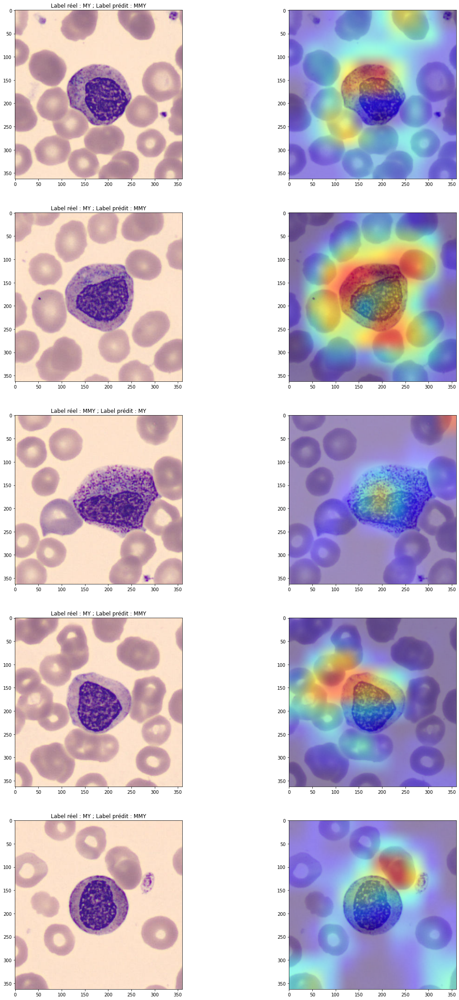

In [20]:
# Exemple : Confusion MY/MMY : labels 5 et 7
conf_my_mmy = df_false[((df_false["real"] == 5) & (df_false["pred"] == 7)) | ((df_false["real"] == 7) & (df_false["pred"] == 5))]

fig = plt.figure(figsize = (20, 40))
i = 0

for id in np.random.choice(conf_my_mmy.index, size = 5, replace = False):

  img_path = conf_my_mmy.loc[id,"img_path"]
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)
  fig.add_subplot(5,2,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title("Label réel : %s ; Label prédit : %s"%(list(label_map.keys())[conf_my_mmy.loc[id,"real"]],
                                                   list(label_map.keys())[conf_my_mmy.loc[id,"pred"]]))
  
  fig.add_subplot(5,2,i+2)
  plt.imshow(superimposed_img)
  i += 2

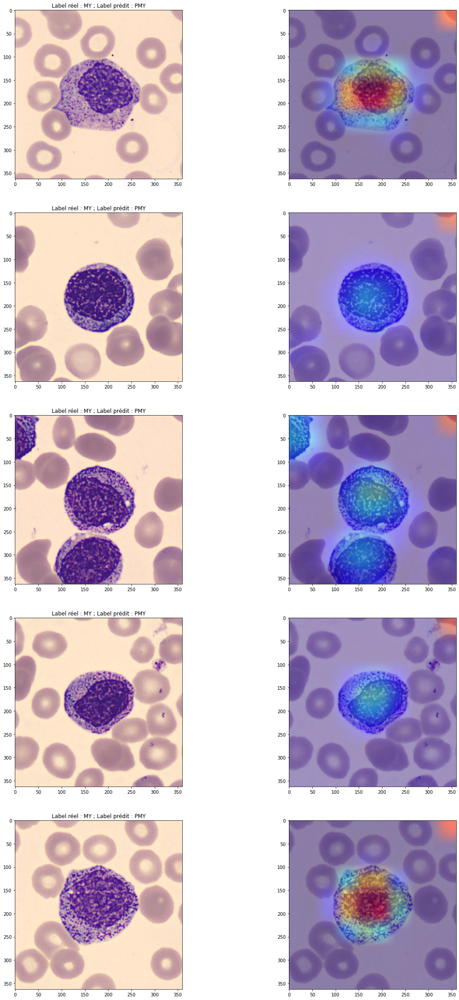

In [21]:
# Exemple : Confusion PMY/MY : labels 9 et 7
conf_pmy_my = df_false[((df_false["real"] == 9) & (df_false["pred"] == 7)) | ((df_false["real"] == 7) & (df_false["pred"] == 9))]

fig = plt.figure(figsize = (20, 40))
i = 0

for id in np.random.choice(conf_pmy_my.index, size = 5, replace = False):

  img_path = conf_pmy_my.loc[id,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)
  fig.add_subplot(5,2,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title("Label réel : %s ; Label prédit : %s"%(list(label_map.keys())[conf_pmy_my.loc[id,"real"]],
                                                   list(label_map.keys())[conf_pmy_my.loc[id,"pred"]]))
  
  fig.add_subplot(5,2,i+2)
  plt.imshow(superimposed_img)
  i += 2

In [ ]:
##############################################################################################################################################################################################

In [ ]:
################################################################################ MODEL - FULLY TRAINED. ######################################################################################
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB3(include_top = False,
                           weights = None,
                           input_shape = (img_height,img_width,3),
                           input_tensor = inputs,
                           pooling = 'avg')
base_output = base_model.output
x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
# Callbacks
TON = TerminateOnNaN()

save_model = ModelCheckpoint(filepath = '/content/drive/MyDrive/Leukopy/EfficientNetModelB3_FullTrained/model_trainingsave', 
                             monitor = 'val_loss', 
                             save_best_only = True,
                             save_weights_only = False,
                             save_freq = 'epoch')

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 5, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 100
history = model.fit(x = training_set, 
                    epochs = epochs,
                    callbacks = callbacks_list, 
                    validation_data = validation_set, 
                    class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 379s 918ms/step - loss: 8.8004 - accuracy: 0.4836 - val_loss: 12.4952 - val_accuracy: 0.1422
Epoch 2/100
397/397 [==============================] - 364s 916ms/step - loss: 5.4816 - accuracy: 0.6781 - val_loss: 0.8449 - val_accuracy: 0.7012
Epoch 3/100
397/397 [==============================] - 361s 908ms/step - loss: 4.4687 - accuracy: 0.7425 - val_loss: 3.7071 - val_accuracy: 0.4358
Epoch 4/100
397/397 [==============================] - 362s 911ms/step - loss: 3.7362 - accuracy: 0.7785 - val_loss: 7.3270 - val_accuracy: 0.2850
Epoch 5/100
397/397 [==============================] - 363s 913ms/step - loss: 3.0691 - accuracy: 0.8206 - val_loss: 3.0204 - val_accuracy: 0.5098

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 6/100
397/397 [==============================] - 363s 913ms/step - loss: 2.3454 - accuracy: 0.8607 - val_loss: 0.3007 - val_accuracy: 0.8798
Epoch 7/100
397/397 [==============

In [ ]:
model.summary()

Model: "model_119"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 300, 300, 3) 0                                            
__________________________________________________________________________________________________
rescaling_3 (Rescaling)         (None, 300, 300, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
normalization_3 (Normalization) (None, 300, 300, 3)  7           rescaling_3[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 301, 301, 3)  0           normalization_3[0][0]            
__________________________________________________________________________________________

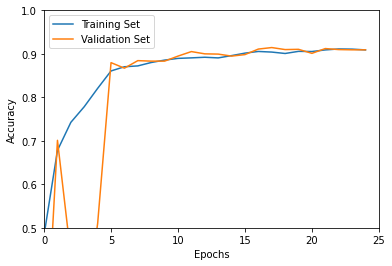

In [ ]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

plt.figure()
plt.plot(np.arange(25), training_accuracy, label = 'Training Set')
plt.plot(np.arange(25), validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,25])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
## Évaluation sur les données de test :
model.evaluate(testing_set)

80/80 [==============================] - 11s 136ms/step - loss: 0.2411 - accuracy: 0.9025


[0.2410687804222107, 0.902515709400177]

In [ ]:
## Sauvegarde :
model.save("/content/drive/MyDrive/Leukopy/EfficientNetModelB3_FullTrained/fulltrain_fullsave")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EfficientNetModelB3_FullTrained/fulltrain_fullsave/assets


In [50]:
############### Analyse :
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/EfficientNetModelB3_FullTrained/fulltrain_fullsave")
model.evaluate(testing_set)

80/80 [==============================] - 13s 135ms/step - loss: 0.2411 - accuracy: 0.9025


[0.2410687655210495, 0.902515709400177]

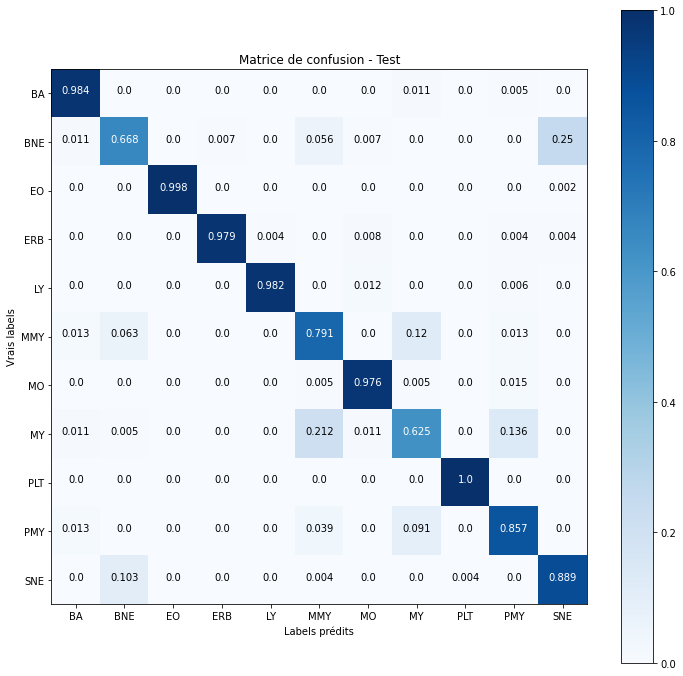

Classification Report - Test


,precision,recall,f1-score,support
BA,0.958763,0.984127,0.971279,189
BNE,0.824885,0.66791,0.738144,268
EO,1,0.997685,0.998841,432
ERB,0.991453,0.978903,0.985138,237
LY,0.993976,0.982143,0.988024,168
MMY,0.679348,0.791139,0.730994,158
MO,0.961722,0.975728,0.968675,206
MY,0.798611,0.625,0.70122,184
PLT,0.997253,1,0.998624,363
PMY,0.666667,0.857143,0.75,77


In [51]:
### 1 -- Matrice de confusion + rapport de classification sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [52]:
### 2 -- DataFrames pour l'exploitation
# DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

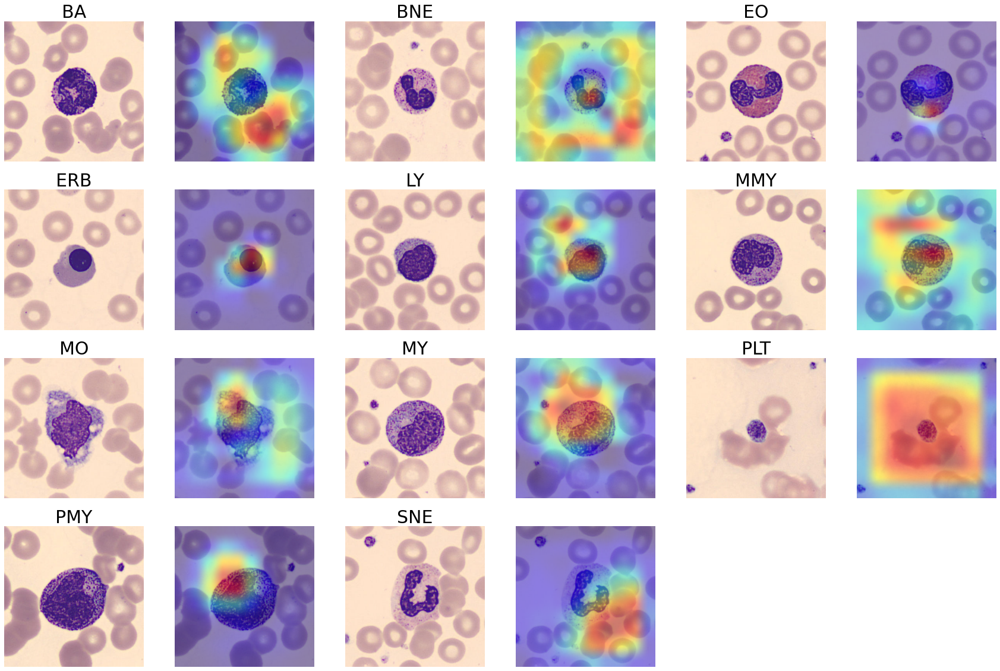

In [53]:
### 3 -- Grad-CAM sur les images bien classées :

from IPython.display import Image, display
import matplotlib.cm as cm


fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EfficientNetModelB3_FullTrained/B3_gradcam_fullytrained")

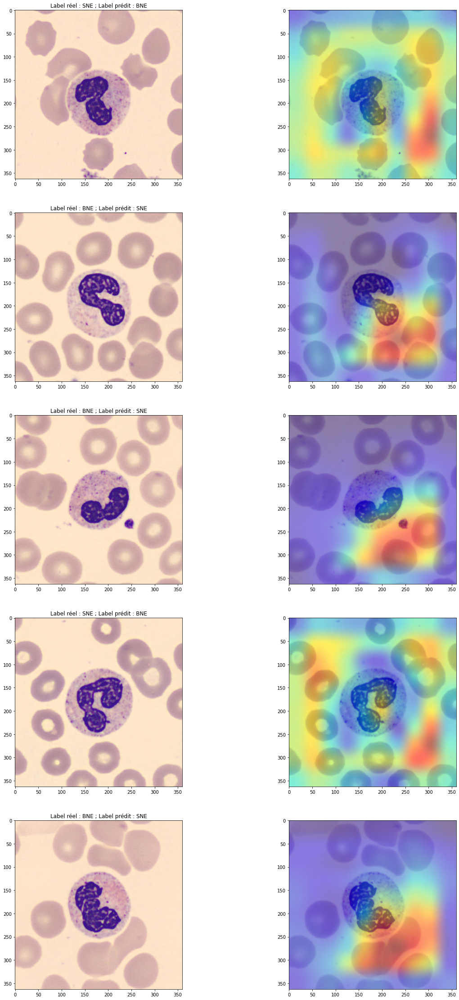

In [26]:
### 4 -- Exemples d'images mal classées :
# Exemple : Confusion BNE/SNE : labels 1 et 10

conf_bne_sne = df_false[((df_false["real"] == 1) & (df_false["pred"] == 10)) | ((df_false["real"] == 10) & (df_false["pred"] == 1))]

i = 0

fig = plt.figure(figsize = (20,40))

for id in np.random.choice(conf_bne_sne.index, size = 5, replace = False):
  img_path = conf_bne_sne.loc[id,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(5,2,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title("Label réel : %s ; Label prédit : %s"%(list(label_map.keys())[conf_bne_sne.loc[id,"real"]],
                                                   list(label_map.keys())[conf_bne_sne.loc[id,"pred"]]))
  
  fig.add_subplot(5,2,i+2)
  plt.imshow(superimposed_img)
  i = i + 2